In [1]:
import os
import random
import numpy as np
from tqdm import tqdm
import shutil
from IPython.display import HTML

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
matplotlib.rcParams['figure.figsize'] = [5, 5]
matplotlib.rcParams['figure.dpi'] = 200

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import init

import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils

from data_helper import UnlabeledDataset, LabeledDataset
from helper import collate_fn, draw_box

In [2]:
random.seed(0)
np.random.seed(0)
torch.manual_seed(0);

device = ("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
data_dir = '/home/cassava_media_arts/data'
annotation_csv = '/home/cassava_media_arts/data/annotation.csv'

resume_training_from_checkpoint = True
load_checkpoint_path = '/home/cassava_media_arts/training_checkpoints/cgan_road_images_2.pth.tar'
save_checkpoint_path = '/home/cassava_media_arts/training_checkpoints/cgan_road_images_2.pth.tar'

In [4]:
def save_checkpoint(fpath, state):
    torch.save(state, fpath)
    
def print_sys_mem_usage():
    print("Memory usage (RAM):\n")
    !free -h
    print("\nGPU Memory Usage:\n")
    !nvidia-smi --query-gpu=memory.used --format=csv
    !nvidia-smi --query-gpu=memory.total --format=csv
    print("\n")
    
def print_train_stats(epoch, n_epochs, i, n_batches, loss_d_total, loss_g_total, d_real_mean, d_gen_mean_pre, d_gen_mean_post):
    print('Epoch: [%d/%d]\tBatch: [%d/%d]\n' % (epoch + 1, n_epochs, i, n_batches),
          'Loss_D: %.4f\tLoss_G: %.4f\n' % (loss_d_total.item(), loss_g_total.item()),
          'D(real): %.4f  ||  D(gen) Pre-step: %.4f  ||  D(gen) Post-step: %.4f\n' %
          (d_real_mean, d_gen_mean_pre, d_gen_mean_post))

### Set Initial Parameters

In [5]:
batch_size = 14

### Create Dataset and Dataloader

In [6]:
unlabeled_scene_index = np.arange(106)
labeled_scene_index_train = np.arange(106, 134)
labeled_scene_index_test = np.arange(125, 128)

In [7]:
labeled_trainset = LabeledDataset(image_folder=data_dir,
                                  annotation_file=annotation_csv,
                                  scene_index=labeled_scene_index_train,
                                  img_transform=transforms.Compose([transforms.Resize((256,256)),
                                                                    transforms.ToTensor(),
                                                                    transforms.Normalize(mean=(0.5,), std=(0.5,))
                                                                   ]),
                                  map_transform=transforms.Compose([transforms.ToPILImage(),
                                                                    transforms.Resize(256),
                                                                    transforms.ToTensor()
                                                                   ]),
                                  extra_info=True
                                 )

trainloader = torch.utils.data.DataLoader(labeled_trainset,
                                          batch_size=batch_size,
                                          shuffle=True,
                                          num_workers=2,
                                          collate_fn=collate_fn,
                                          pin_memory=True)

In [8]:
labeled_trainset[1][0].size()

torch.Size([18, 256, 256])

In [9]:
for images, road_maps in trainloader:
    print(images.size())
    break

torch.Size([14, 18, 256, 256])


### Define models

In [10]:
class ResnetBlock(nn.Module):
    """
    Define a Resnet block
    A resnet block is a conv block with skip connections
    Original Resnet paper: https://arxiv.org/pdf/1512.03385.pdf
    """
    def __init__(self, dim):
        """
        Parameters:
            dim (int)           -- the number of channels in the conv layer.
            padding_type (str)  -- the name of padding layer: reflect | replicate | zero
            use_dropout (bool)  -- if use dropout layers.
            use_bias (bool)     -- if the conv layer uses bias or not
        """
        super(ResnetBlock, self).__init__()
        self.resnet_block = nn.Sequential(nn.Conv2d(dim, dim, kernel_size=3, padding=1),
                                          nn.BatchNorm2d(dim),
                                          nn.ReLU(True),
                                          nn.Dropout(0.5),
                                          nn.Conv2d(dim, dim, kernel_size=3, padding=1),
                                          nn.BatchNorm2d(dim)
                                         )
        
    def forward(self, x):
        return x + self.resnet_block(x)  # add skip connections

In [11]:
class Generator(nn.Module):
    """
    RESNET-based generator that consists of Resnet blocks + downsampling/upsampling operations.
    """
    def __init__(self, in_ch, out_ch, ngf, n_blocks=6, init_gain=0.02):
        """
        Parameters:
            in_ch (int)         -- the number of channels in input images
            out_ch (int)        -- the number of channels in output images
            ngf (int)           -- the number of filters in the last conv layer
            n_blocks (int)      -- the number of ResNet blocks
            padding_type (str)  -- the name of padding layer in conv layers: reflect | replicate | zero
        """        
        assert(n_blocks >= 0)
        super(Generator, self).__init__()
        
        self.model = nn.Sequential(
            nn.ReflectionPad2d(3),
            
            nn.Conv2d(in_ch, ngf, kernel_size=7, padding=0),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            nn.Conv2d(ngf, ngf * 2, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            
            nn.Conv2d(ngf * 2, ngf * 4, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            
            ResnetBlock(ngf * 4),  #1
            ResnetBlock(ngf * 4),  #2
            ResnetBlock(ngf * 4),  #3
            ResnetBlock(ngf * 4),  #4
            ResnetBlock(ngf * 4),  #5
            ResnetBlock(ngf * 4),  #6
            ResnetBlock(ngf * 4),  #7
            ResnetBlock(ngf * 4),  #8
            ResnetBlock(ngf * 4),  #9
            ResnetBlock(ngf * 4),  #10
            ResnetBlock(ngf * 4),  #11
            ResnetBlock(ngf * 4),  #12


            nn.ConvTranspose2d(ngf * 4, int(ngf * 2), kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(int(ngf * 2)),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(ngf * 2, int(ngf), kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(int(ngf)),
            nn.ReLU(True),

            nn.ReflectionPad2d(3),
            nn.Conv2d(ngf, out_ch, kernel_size=7, padding=0),
            nn.Tanh()
        )
        
    def forward(self, x):
        return self.model(x)

In [12]:
class Discriminator(nn.Module):
    def __init__(self, in_ch, ndf=64, n_layers=3):  
        super(Discriminator, self).__init__()
        
        self.block1 = nn.Sequential(nn.Conv2d(in_ch, ndf, kernel_size=4, stride=2, padding=1),
                                    nn.LeakyReLU(0.2, True)
                                   )
        
        nf_mult = 1
        nf_mult_prev = 1
        sequence2 = []        
        for n in range(1, n_layers):  # gradually increase the number of filters
            nf_mult_prev = nf_mult
            nf_mult = min(2 ** n, 8)
            sequence2 += [nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=4, stride=2, padding=1),
                         nn.BatchNorm2d(ndf * nf_mult),
                         nn.LeakyReLU(0.2, True)
                         ]
        self.block2 = nn.Sequential(*sequence2)
        
        sequence3 = []
        nf_mult_prev = nf_mult
        nf_mult = min(2 ** n_layers, 8)
        sequence3 += [nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=4, stride=1, padding=1),
                     nn.BatchNorm2d(ndf * nf_mult),
                     nn.LeakyReLU(0.2, True)
                     ]
        self.block3 = nn.Sequential(*sequence3)
        
        self.model = nn.Sequential(self.block1,
                                   self.block2,
                                   self.block3,
                                   nn.Conv2d(ndf * nf_mult, 1, kernel_size=4, stride=1, padding=1)
                                  )
        
    def forward(self, x):
        return self.model(x)

In [13]:
# # Sanity check - dimensions of inputs and outputs to both networks.

# test = torch.zeros([batch_size, 18, 256, 256])
# print("Input to generator:\t", test.size())

# test_generator = Generator(in_ch, out_ch, ngf, n_blocks=n_blocks_g, init_gain=0.02)
# test_result_g = test_generator(test)
# print("\nOutput of generator:\t", test_result_g.size())

# test_d_input = torch.cat((test_result_g, test), 1)
# print("\nInput to discriminator:\t", test_d_input.size())

# test_discriminator = Discriminator(in_ch + out_ch, ndf=ndf, n_layers=n_layers_d)
# test_result_d = test_discriminator(test_d_input)
# print("\nOutput of discriminator:", test_result_d.size())

In [14]:
class GANLoss(nn.Module):
    """
    The GANLoss class abstracts away the need to create the target label tensor
    that has the same size as the input.
    """
    def __init__(self, gan_mode, real_label=1.0, gen_label=0.0):
        """
        Parameters:
            gan_mode (str) - - the type of GAN objective. It currently supports vanilla, lsgan, and wgangp.
            target_real_label (bool) - - label for a real image
            target_gen_label (bool) - - label of a generated image
        Note: Do not use sigmoid as the last layer of Discriminator.
        LSGAN needs no sigmoid. vanilla GANs will handle it with BCEWithLogitsLoss.
        """
        super(GANLoss, self).__init__()
        
        self.gan_mode = gan_mode
        self.real_label = real_label
        self.gen_label = gen_label
        
        if gan_mode == 'LS':
            self.loss = nn.MSELoss().to(device)
        elif gan_mode == 'BCE':
            self.loss = nn.BCEWithLogitsLoss().to(device)

    def get_target_tensor(self, output, target_is_real):
        # Create label tensors with same size as the discriminator output.
        if target_is_real:
            if "cuda" in device:
                target_tensor = torch.cuda.FloatTensor([self.real_label])
            else:
                target_tensor = torch.Tensor([self.real_label])
        else:
            if "cuda" in device:
                target_tensor = torch.cuda.FloatTensor([self.gen_label])
            else:
                target_tensor = torch.Tensor([self.gen_label])
                
        return target_tensor.expand_as(output)

    def __call__(self, output, target_is_real):
        target_tensor = self.get_target_tensor(output, target_is_real)
        loss = self.loss(output, target_tensor)
        return loss

In [15]:
def init_weights(m):  # define the initialization function
    classname = m.__class__.__name__
    if hasattr(m, 'weight') and (classname.find('Conv') != -1 or classname.find('Linear') != -1):
        init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2d') != -1:  # BatchNorm Layer's weight is not a matrix; only normal distribution applies.
        init.normal_(m.weight.data, 1.0, 0.02)
        init.constant_(m.bias.data, 0.0)

### Train

In [16]:
update_stats_rate = 25
debug_mem_usage = False
losses_g = []
losses_d = []
intermediate_images = []

In [17]:
in_ch = 18
out_ch = 1
ngf = 128
ndf = 64
n_blocks_g = 9
n_layers_d = 3

start_epoch = 0
n_epochs = 200
lr_g = 0.00005
lr_d = 0.0002
beta1 = 0.5
beta2 = 0.999
L1_lambda = 100

real_label = 1.0
gen_label = 0.0

In [18]:
generator = Generator(in_ch, out_ch, ngf, n_blocks=n_blocks_g, init_gain=0.02).to(device)
discriminator = Discriminator(in_ch + out_ch, ndf=ndf, n_layers=n_layers_d).to(device)

generator.apply(init_weights)
discriminator.apply(init_weights)

generator.train()
discriminator.train()


# We combine GAN Loss and L1 Loss to attain Total Loss
criterion_gan = GANLoss('BCE', real_label=real_label, gen_label=gen_label).to(device)
criterion_L1 = nn.L1Loss().to(device)

optim_G = torch.optim.Adam(generator.parameters(), lr=lr_g, betas=(beta1, beta2))
optim_D = torch.optim.Adam(discriminator.parameters(), lr=lr_d, betas=(beta1, beta2))

In [19]:
"""
Optional: Load checkpoint from most recent training run if resuming from previous trial.
"""
if resume_training_from_checkpoint:
    if os.path.isfile(load_checkpoint_path):
        print("=> loading checkpoint '{}'".format(load_checkpoint_path))
        
        checkpoint = torch.load(load_checkpoint_path)
        start_epoch = checkpoint['epoch']
        losses_g = checkpoint['losses_g']
        losses_d = checkpoint['losses_d']
        intermediate_images = checkpoint['intermediate_images']
        
        generator.load_state_dict(checkpoint['g_state_dict'])
        discriminator.load_state_dict(checkpoint['d_state_dict'])
        optim_G.load_state_dict(checkpoint['optim_g'])
        optim_D.load_state_dict(checkpoint['optim_d'])
        
        print("=> loaded checkpoint '{}' (epoch {})".format(load_checkpoint_path, checkpoint['epoch']))
    else:
        print("=> no checkpoint found at '{}'".format(load_checkpoint_path))

=> loading checkpoint '/home/cassava_media_arts/training_checkpoints/cgan_road_images_2.pth.tar'
=> loaded checkpoint '/home/cassava_media_arts/training_checkpoints/cgan_road_images_2.pth.tar' (epoch 27)


In [20]:
####################################
########## TRAINING LOOP ###########
####################################

n_batches = len(trainloader)
for epoch in range(start_epoch, n_epochs):
    iters = 1
    for real_18ch, real_map in tqdm(trainloader):
        """
        TRAIN DISCRIMINATOR ON BOTH REAL + GENERATED SAMPLES
        """
        real_18ch = real_18ch.to(device)
        real_map = real_map.to(device)
        
        gen_map = generator(real_18ch)
        
        real_19ch = torch.cat((real_18ch, real_map), 1).to(device)
        gen_19ch = torch.cat((real_18ch, gen_map), 1).to(device)

        output_real = discriminator(real_19ch)
        output_gen = discriminator(gen_19ch.detach())
        
        d_real_mean = output_real.mean().item()
        d_gen_mean_pre = output_gen.mean().item()

        # Make label tensors.
        target_real = torch.Tensor([real_label]).expand_as(output_real).to(device)
        target_gen = torch.Tensor([gen_label]).expand_as(output_gen).to(device)

        # Compute loss.
        loss_d_real = criterion_gan(output_real, target_is_real=True)
        loss_d_gen = criterion_gan(output_gen, target_is_real=False)
        loss_d_total = (loss_d_real + loss_d_gen)

        discriminator.zero_grad()
        loss_d_total.backward()
        optim_D.step()
        
        """
        TRAIN GENERATOR
        """
        output_gen = discriminator(gen_19ch)
        loss_g_gan = criterion_gan(output_gen, target_is_real=True)
        loss_g_L1 = L1_lambda * criterion_L1(gen_map, real_map)
        loss_g_total = loss_g_gan + loss_g_L1
        d_gen_mean_post = output_gen.mean().item()
        
        generator.zero_grad()
        loss_g_total.backward()
        optim_G.step()
        
        """
        COMPILE TRAINING STATISTICS
        """
        losses_d.append(loss_d_total.item())
        losses_g.append(loss_g_total.item())
        
        if iters % update_stats_rate == 1:
            print_train_stats(epoch, n_epochs, iters, n_batches,
                              loss_d_total, loss_g_total, d_real_mean, d_gen_mean_pre, d_gen_mean_post)

        iters += 1
    
    # Add generated image to intermediate images list.
    with torch.no_grad():
        gen_map = generator(real_18ch).detach().cpu()
    intermediate_images.append(vutils.make_grid(gen_map, normalize=True))
    
    save_checkpoint(save_checkpoint_path,
                    {'epoch': epoch + 1,
                     'g_state_dict': generator.state_dict(),
                     'd_state_dict': discriminator.state_dict(),
                     'optim_g' : optim_G.state_dict(),
                     'optim_d' : optim_D.state_dict(),
                     'losses_g' : losses_g,
                     'losses_d' : losses_d,
                     'intermediate_images' : intermediate_images,                     
                    })
    
    if debug_mem_usage and epoch % 10 == 0:
        print_sys_mem_usage()

  0%|          | 1/252 [00:03<14:47,  3.54s/it]

Epoch: [28/200]	Batch: [1/252]
 Loss_D: 0.7848	Loss_G: 10.8729
 D(real): 0.3133  ||  D(gen) Pre-step: -2.0705  ||  D(gen) Post-step: -1.1622



 10%|█         | 26/252 [00:42<05:51,  1.55s/it]

Epoch: [28/200]	Batch: [26/252]
 Loss_D: 0.5236	Loss_G: 10.6012
 D(real): 2.1527  ||  D(gen) Pre-step: -0.9678  ||  D(gen) Post-step: -1.6599



 20%|██        | 51/252 [01:21<05:12,  1.55s/it]

Epoch: [28/200]	Batch: [51/252]
 Loss_D: 1.8157	Loss_G: 6.7831
 D(real): -1.3226  ||  D(gen) Pre-step: -1.6376  ||  D(gen) Post-step: -0.2672



 30%|███       | 76/252 [02:00<04:33,  1.55s/it]

Epoch: [28/200]	Batch: [76/252]
 Loss_D: 1.2607	Loss_G: 9.9076
 D(real): 0.7007  ||  D(gen) Pre-step: 0.0659  ||  D(gen) Post-step: -0.2580



 40%|████      | 101/252 [02:38<03:54,  1.55s/it]

Epoch: [28/200]	Batch: [101/252]
 Loss_D: 1.1381	Loss_G: 6.8039
 D(real): -0.2111  ||  D(gen) Pre-step: -1.5262  ||  D(gen) Post-step: -0.4880



 50%|█████     | 126/252 [03:17<03:15,  1.55s/it]

Epoch: [28/200]	Batch: [126/252]
 Loss_D: 0.4939	Loss_G: 13.6212
 D(real): 3.6508  ||  D(gen) Pre-step: -0.6789  ||  D(gen) Post-step: -1.5934



 60%|█████▉    | 151/252 [03:56<02:36,  1.55s/it]

Epoch: [28/200]	Batch: [151/252]
 Loss_D: 0.9010	Loss_G: 11.1475
 D(real): 0.6297  ||  D(gen) Pre-step: -0.8155  ||  D(gen) Post-step: -1.1631



 70%|██████▉   | 176/252 [04:35<01:58,  1.55s/it]

Epoch: [28/200]	Batch: [176/252]
 Loss_D: 0.8865	Loss_G: 9.9524
 D(real): 2.0779  ||  D(gen) Pre-step: -0.0466  ||  D(gen) Post-step: -1.6043



 80%|███████▉  | 201/252 [05:14<01:19,  1.55s/it]

Epoch: [28/200]	Batch: [201/252]
 Loss_D: 0.3589	Loss_G: 11.7628
 D(real): 1.6751  ||  D(gen) Pre-step: -2.2912  ||  D(gen) Post-step: -2.2879



 90%|████████▉ | 226/252 [05:52<00:40,  1.55s/it]

Epoch: [28/200]	Batch: [226/252]
 Loss_D: 1.2559	Loss_G: 8.9413
 D(real): 1.9256  ||  D(gen) Pre-step: 0.6008  ||  D(gen) Post-step: -1.4689



100%|█████████▉| 251/252 [06:31<00:01,  1.55s/it]

Epoch: [28/200]	Batch: [251/252]
 Loss_D: 0.5098	Loss_G: 11.5490
 D(real): 1.9567  ||  D(gen) Pre-step: -1.0569  ||  D(gen) Post-step: -2.1718



  0%|          | 1/252 [00:02<12:25,  2.97s/it]

Epoch: [29/200]	Batch: [1/252]
 Loss_D: 0.4129	Loss_G: 10.2614
 D(real): 1.7285  ||  D(gen) Pre-step: -1.5760  ||  D(gen) Post-step: -1.6546



 10%|█         | 26/252 [00:41<05:50,  1.55s/it]

Epoch: [29/200]	Batch: [26/252]
 Loss_D: 1.0580	Loss_G: 8.8890
 D(real): 0.6007  ||  D(gen) Pre-step: -0.7092  ||  D(gen) Post-step: -1.2662



 20%|██        | 51/252 [01:20<05:11,  1.55s/it]

Epoch: [29/200]	Batch: [51/252]
 Loss_D: 0.7320	Loss_G: 9.3279
 D(real): 1.4280  ||  D(gen) Pre-step: -0.7032  ||  D(gen) Post-step: -1.2299



 30%|███       | 76/252 [01:59<04:33,  1.55s/it]

Epoch: [29/200]	Batch: [76/252]
 Loss_D: 1.4838	Loss_G: 7.6680
 D(real): -0.9713  ||  D(gen) Pre-step: -2.3349  ||  D(gen) Post-step: -0.2781



 40%|████      | 101/252 [02:38<03:54,  1.55s/it]

Epoch: [29/200]	Batch: [101/252]
 Loss_D: 0.5957	Loss_G: 12.2022
 D(real): 1.0544  ||  D(gen) Pre-step: -1.9653  ||  D(gen) Post-step: -1.7398



 50%|█████     | 126/252 [03:17<03:15,  1.55s/it]

Epoch: [29/200]	Batch: [126/252]
 Loss_D: 0.5572	Loss_G: 10.1419
 D(real): 1.7172  ||  D(gen) Pre-step: -1.0706  ||  D(gen) Post-step: -0.7024



 60%|█████▉    | 151/252 [03:55<02:36,  1.55s/it]

Epoch: [29/200]	Batch: [151/252]
 Loss_D: 0.3993	Loss_G: 10.5853
 D(real): 1.4117  ||  D(gen) Pre-step: -2.2544  ||  D(gen) Post-step: -2.4018



 70%|██████▉   | 176/252 [04:34<01:57,  1.55s/it]

Epoch: [29/200]	Batch: [176/252]
 Loss_D: 1.0883	Loss_G: 7.9380
 D(real): -0.0493  ||  D(gen) Pre-step: -1.1466  ||  D(gen) Post-step: -0.4629



 80%|███████▉  | 201/252 [05:13<01:19,  1.55s/it]

Epoch: [29/200]	Batch: [201/252]
 Loss_D: 1.0767	Loss_G: 11.3197
 D(real): 3.1605  ||  D(gen) Pre-step: 0.4606  ||  D(gen) Post-step: -1.6491



 90%|████████▉ | 226/252 [05:52<00:40,  1.55s/it]

Epoch: [29/200]	Batch: [226/252]
 Loss_D: 1.0923	Loss_G: 9.3072
 D(real): 1.7117  ||  D(gen) Pre-step: 0.2002  ||  D(gen) Post-step: -1.7357



100%|█████████▉| 251/252 [06:31<00:01,  1.55s/it]

Epoch: [29/200]	Batch: [251/252]
 Loss_D: 0.6331	Loss_G: 11.0691
 D(real): 1.0228  ||  D(gen) Pre-step: -1.9009  ||  D(gen) Post-step: -1.2483



  0%|          | 1/252 [00:03<12:33,  3.00s/it]

Epoch: [30/200]	Batch: [1/252]
 Loss_D: 0.6221	Loss_G: 10.2085
 D(real): 3.9858  ||  D(gen) Pre-step: -0.4331  ||  D(gen) Post-step: -1.6784



 10%|█         | 26/252 [00:41<05:50,  1.55s/it]

Epoch: [30/200]	Batch: [26/252]
 Loss_D: 1.0962	Loss_G: 10.0523
 D(real): -0.4058  ||  D(gen) Pre-step: -2.1923  ||  D(gen) Post-step: -1.4852



 20%|██        | 51/252 [01:20<05:12,  1.55s/it]

Epoch: [30/200]	Batch: [51/252]
 Loss_D: 0.3939	Loss_G: 11.5850
 D(real): 1.4862  ||  D(gen) Pre-step: -2.0911  ||  D(gen) Post-step: -2.1665



 30%|███       | 76/252 [01:59<04:33,  1.55s/it]

Epoch: [30/200]	Batch: [76/252]
 Loss_D: 1.0055	Loss_G: 11.1756
 D(real): -0.2209  ||  D(gen) Pre-step: -2.4844  ||  D(gen) Post-step: -1.4701



 40%|████      | 101/252 [02:38<03:54,  1.55s/it]

Epoch: [30/200]	Batch: [101/252]
 Loss_D: 0.5006	Loss_G: 12.4963
 D(real): 2.4736  ||  D(gen) Pre-step: -0.8861  ||  D(gen) Post-step: -0.9831



 50%|█████     | 126/252 [03:17<03:15,  1.55s/it]

Epoch: [30/200]	Batch: [126/252]
 Loss_D: 1.0221	Loss_G: 12.2083
 D(real): 2.8833  ||  D(gen) Pre-step: -0.2377  ||  D(gen) Post-step: -1.2635



 60%|█████▉    | 151/252 [03:55<02:36,  1.55s/it]

Epoch: [30/200]	Batch: [151/252]
 Loss_D: 1.0625	Loss_G: 10.7489
 D(real): 0.0159  ||  D(gen) Pre-step: -1.5870  ||  D(gen) Post-step: -0.8050



 70%|██████▉   | 176/252 [04:34<01:58,  1.55s/it]

Epoch: [30/200]	Batch: [176/252]
 Loss_D: 1.4538	Loss_G: 7.7342
 D(real): -0.2393  ||  D(gen) Pre-step: -1.5253  ||  D(gen) Post-step: -0.3968



 80%|███████▉  | 201/252 [05:13<01:19,  1.55s/it]

Epoch: [30/200]	Batch: [201/252]
 Loss_D: 1.1716	Loss_G: 9.1329
 D(real): 2.7601  ||  D(gen) Pre-step: 0.4764  ||  D(gen) Post-step: -1.2520



 90%|████████▉ | 226/252 [05:52<00:40,  1.55s/it]

Epoch: [30/200]	Batch: [226/252]
 Loss_D: 0.4405	Loss_G: 12.8271
 D(real): 2.0256  ||  D(gen) Pre-step: -1.6787  ||  D(gen) Post-step: -2.3925



100%|█████████▉| 251/252 [06:31<00:01,  1.55s/it]

Epoch: [30/200]	Batch: [251/252]
 Loss_D: 0.9968	Loss_G: 8.5078
 D(real): 0.6628  ||  D(gen) Pre-step: -0.5405  ||  D(gen) Post-step: -0.3387



  0%|          | 1/252 [00:02<12:20,  2.95s/it]

Epoch: [31/200]	Batch: [1/252]
 Loss_D: 0.8227	Loss_G: 10.5312
 D(real): 0.0694  ||  D(gen) Pre-step: -2.8685  ||  D(gen) Post-step: -2.1505



 10%|█         | 26/252 [00:41<05:50,  1.55s/it]

Epoch: [31/200]	Batch: [26/252]
 Loss_D: 1.0256	Loss_G: 8.4200
 D(real): 2.3508  ||  D(gen) Pre-step: 0.2454  ||  D(gen) Post-step: -1.1797



 20%|██        | 51/252 [01:20<05:11,  1.55s/it]

Epoch: [31/200]	Batch: [51/252]
 Loss_D: 1.0588	Loss_G: 9.0389
 D(real): 3.1616  ||  D(gen) Pre-step: 0.4011  ||  D(gen) Post-step: -0.8108



 30%|███       | 76/252 [01:59<04:33,  1.55s/it]

Epoch: [31/200]	Batch: [76/252]
 Loss_D: 0.3435	Loss_G: 12.8623
 D(real): 1.8314  ||  D(gen) Pre-step: -1.9167  ||  D(gen) Post-step: -2.0569



 40%|████      | 101/252 [02:38<03:54,  1.55s/it]

Epoch: [31/200]	Batch: [101/252]
 Loss_D: 0.8901	Loss_G: 11.2599
 D(real): -0.0887  ||  D(gen) Pre-step: -2.8421  ||  D(gen) Post-step: -1.2577



 50%|█████     | 126/252 [03:17<03:15,  1.55s/it]

Epoch: [31/200]	Batch: [126/252]
 Loss_D: 1.0798	Loss_G: 8.7098
 D(real): 1.9571  ||  D(gen) Pre-step: 0.2820  ||  D(gen) Post-step: -0.8122



 60%|█████▉    | 151/252 [03:55<02:36,  1.55s/it]

Epoch: [31/200]	Batch: [151/252]
 Loss_D: 0.3992	Loss_G: 9.6144
 D(real): 1.5955  ||  D(gen) Pre-step: -1.8534  ||  D(gen) Post-step: -1.9181



 70%|██████▉   | 176/252 [04:34<01:58,  1.55s/it]

Epoch: [31/200]	Batch: [176/252]
 Loss_D: 0.4719	Loss_G: 13.8447
 D(real): 2.1019  ||  D(gen) Pre-step: -1.1305  ||  D(gen) Post-step: -1.6343



 80%|███████▉  | 201/252 [05:13<01:19,  1.55s/it]

Epoch: [31/200]	Batch: [201/252]
 Loss_D: 0.7224	Loss_G: 10.3422
 D(real): 0.5377  ||  D(gen) Pre-step: -2.1880  ||  D(gen) Post-step: -1.0762



 90%|████████▉ | 226/252 [05:52<00:40,  1.55s/it]

Epoch: [31/200]	Batch: [226/252]
 Loss_D: 0.6332	Loss_G: 12.8077
 D(real): 1.9371  ||  D(gen) Pre-step: -0.8475  ||  D(gen) Post-step: -1.7788



100%|█████████▉| 251/252 [06:31<00:01,  1.55s/it]

Epoch: [31/200]	Batch: [251/252]
 Loss_D: 0.4136	Loss_G: 10.4413
 D(real): 1.5049  ||  D(gen) Pre-step: -1.8565  ||  D(gen) Post-step: -1.3573



  0%|          | 1/252 [00:02<12:05,  2.89s/it]

Epoch: [32/200]	Batch: [1/252]
 Loss_D: 0.9259	Loss_G: 12.4386
 D(real): -0.1245  ||  D(gen) Pre-step: -2.1851  ||  D(gen) Post-step: -1.4166



 10%|█         | 26/252 [00:41<05:50,  1.55s/it]

Epoch: [32/200]	Batch: [26/252]
 Loss_D: 0.4322	Loss_G: 8.9307
 D(real): 1.8143  ||  D(gen) Pre-step: -1.4471  ||  D(gen) Post-step: -1.8745



 20%|██        | 51/252 [01:20<05:12,  1.55s/it]

Epoch: [32/200]	Batch: [51/252]
 Loss_D: 0.4715	Loss_G: 14.1520
 D(real): 0.9850  ||  D(gen) Pre-step: -2.6245  ||  D(gen) Post-step: -2.6189



 30%|███       | 76/252 [01:59<04:33,  1.55s/it]

Epoch: [32/200]	Batch: [76/252]
 Loss_D: 0.8858	Loss_G: 10.9279
 D(real): 0.3875  ||  D(gen) Pre-step: -1.4327  ||  D(gen) Post-step: 0.3192



 40%|████      | 101/252 [02:38<03:54,  1.55s/it]

Epoch: [32/200]	Batch: [101/252]
 Loss_D: 0.7274	Loss_G: 12.5998
 D(real): 0.9299  ||  D(gen) Pre-step: -1.0825  ||  D(gen) Post-step: -1.6050



 50%|█████     | 126/252 [03:17<03:15,  1.55s/it]

Epoch: [32/200]	Batch: [126/252]
 Loss_D: 0.3388	Loss_G: 13.1443
 D(real): 1.6540  ||  D(gen) Pre-step: -2.2785  ||  D(gen) Post-step: -2.0926



 60%|█████▉    | 151/252 [03:55<02:36,  1.55s/it]

Epoch: [32/200]	Batch: [151/252]
 Loss_D: 0.8127	Loss_G: 7.5302
 D(real): 1.0823  ||  D(gen) Pre-step: -0.6912  ||  D(gen) Post-step: -1.0200



 70%|██████▉   | 176/252 [04:34<01:58,  1.55s/it]

Epoch: [32/200]	Batch: [176/252]
 Loss_D: 0.6416	Loss_G: 8.7985
 D(real): 1.6398  ||  D(gen) Pre-step: -0.7946  ||  D(gen) Post-step: -1.3466



 80%|███████▉  | 201/252 [05:13<01:19,  1.55s/it]

Epoch: [32/200]	Batch: [201/252]
 Loss_D: 1.1826	Loss_G: 12.4817
 D(real): 0.7210  ||  D(gen) Pre-step: -0.1307  ||  D(gen) Post-step: -0.8327



 90%|████████▉ | 226/252 [05:52<00:40,  1.55s/it]

Epoch: [32/200]	Batch: [226/252]
 Loss_D: 0.4953	Loss_G: 11.4902
 D(real): 0.8625  ||  D(gen) Pre-step: -2.6465  ||  D(gen) Post-step: -1.9084



100%|█████████▉| 251/252 [06:31<00:01,  1.55s/it]

Epoch: [32/200]	Batch: [251/252]
 Loss_D: 0.3959	Loss_G: 11.8916
 D(real): 2.1098  ||  D(gen) Pre-step: -1.5253  ||  D(gen) Post-step: -1.9111



  0%|          | 1/252 [00:02<12:27,  2.98s/it]

Epoch: [33/200]	Batch: [1/252]
 Loss_D: 0.5019	Loss_G: 10.9417
 D(real): 0.7361  ||  D(gen) Pre-step: -3.1242  ||  D(gen) Post-step: -2.3779



 10%|█         | 26/252 [00:41<05:50,  1.55s/it]

Epoch: [33/200]	Batch: [26/252]
 Loss_D: 0.6252	Loss_G: 13.2877
 D(real): 3.7238  ||  D(gen) Pre-step: -0.3797  ||  D(gen) Post-step: -1.9704



 20%|██        | 51/252 [01:20<05:12,  1.55s/it]

Epoch: [33/200]	Batch: [51/252]
 Loss_D: 0.9469	Loss_G: 10.4092
 D(real): 0.1709  ||  D(gen) Pre-step: -1.5467  ||  D(gen) Post-step: -0.8469



 30%|███       | 76/252 [01:59<04:33,  1.55s/it]

Epoch: [33/200]	Batch: [76/252]
 Loss_D: 0.8593	Loss_G: 7.9984
 D(real): 0.9318  ||  D(gen) Pre-step: -0.6830  ||  D(gen) Post-step: -1.6786



 40%|████      | 101/252 [02:38<03:54,  1.55s/it]

Epoch: [33/200]	Batch: [101/252]
 Loss_D: 0.9053	Loss_G: 9.2459
 D(real): 1.7135  ||  D(gen) Pre-step: -0.1550  ||  D(gen) Post-step: -0.9156



 50%|█████     | 126/252 [03:17<03:15,  1.55s/it]

Epoch: [33/200]	Batch: [126/252]
 Loss_D: 0.4625	Loss_G: 10.3370
 D(real): 1.9378  ||  D(gen) Pre-step: -1.2501  ||  D(gen) Post-step: -1.6343



 60%|█████▉    | 151/252 [03:55<02:36,  1.55s/it]

Epoch: [33/200]	Batch: [151/252]
 Loss_D: 0.6079	Loss_G: 10.9998
 D(real): 1.9782  ||  D(gen) Pre-step: -0.8736  ||  D(gen) Post-step: -1.3215



 70%|██████▉   | 176/252 [04:34<01:58,  1.55s/it]

Epoch: [33/200]	Batch: [176/252]
 Loss_D: 0.3558	Loss_G: 10.9098
 D(real): 2.1884  ||  D(gen) Pre-step: -1.7170  ||  D(gen) Post-step: -1.3518



 80%|███████▉  | 201/252 [05:13<01:19,  1.55s/it]

Epoch: [33/200]	Batch: [201/252]
 Loss_D: 0.8893	Loss_G: 13.6584
 D(real): 2.3636  ||  D(gen) Pre-step: 0.0282  ||  D(gen) Post-step: -1.4181



 90%|████████▉ | 226/252 [05:52<00:40,  1.55s/it]

Epoch: [33/200]	Batch: [226/252]
 Loss_D: 1.6339	Loss_G: 12.4664
 D(real): 4.1215  ||  D(gen) Pre-step: 1.3273  ||  D(gen) Post-step: -1.8166



100%|█████████▉| 251/252 [06:31<00:01,  1.55s/it]

Epoch: [33/200]	Batch: [251/252]
 Loss_D: 0.5788	Loss_G: 11.1319
 D(real): 2.4598  ||  D(gen) Pre-step: -0.9302  ||  D(gen) Post-step: -1.7610



  0%|          | 1/252 [00:02<12:02,  2.88s/it]

Epoch: [34/200]	Batch: [1/252]
 Loss_D: 0.6933	Loss_G: 9.8992
 D(real): 0.5277  ||  D(gen) Pre-step: -1.9625  ||  D(gen) Post-step: -1.0221



 10%|█         | 26/252 [00:41<05:51,  1.55s/it]

Epoch: [34/200]	Batch: [26/252]
 Loss_D: 1.3048	Loss_G: 9.5393
 D(real): -0.6722  ||  D(gen) Pre-step: -1.8776  ||  D(gen) Post-step: -0.8238



 20%|██        | 51/252 [01:20<05:12,  1.55s/it]

Epoch: [34/200]	Batch: [51/252]
 Loss_D: 0.8796	Loss_G: 9.6605
 D(real): 0.1802  ||  D(gen) Pre-step: -1.5436  ||  D(gen) Post-step: -1.1440



 30%|███       | 76/252 [01:59<04:33,  1.55s/it]

Epoch: [34/200]	Batch: [76/252]
 Loss_D: 1.1191	Loss_G: 10.0709
 D(real): -0.4943  ||  D(gen) Pre-step: -2.3627  ||  D(gen) Post-step: -0.9912



 40%|████      | 101/252 [02:38<03:54,  1.55s/it]

Epoch: [34/200]	Batch: [101/252]
 Loss_D: 0.5829	Loss_G: 10.4267
 D(real): 2.4388  ||  D(gen) Pre-step: -0.6533  ||  D(gen) Post-step: -1.4958



 50%|█████     | 126/252 [03:16<03:16,  1.56s/it]

Epoch: [34/200]	Batch: [126/252]
 Loss_D: 1.7984	Loss_G: 9.2607
 D(real): -1.3716  ||  D(gen) Pre-step: -2.7244  ||  D(gen) Post-step: -0.7222



 60%|█████▉    | 151/252 [03:55<02:36,  1.55s/it]

Epoch: [34/200]	Batch: [151/252]
 Loss_D: 0.6016	Loss_G: 9.5763
 D(real): 1.0490  ||  D(gen) Pre-step: -1.3671  ||  D(gen) Post-step: -1.2645



 70%|██████▉   | 176/252 [04:34<01:57,  1.55s/it]

Epoch: [34/200]	Batch: [176/252]
 Loss_D: 1.6140	Loss_G: 12.0877
 D(real): 3.6302  ||  D(gen) Pre-step: 1.3072  ||  D(gen) Post-step: -1.3944



 80%|███████▉  | 201/252 [05:13<01:19,  1.55s/it]

Epoch: [34/200]	Batch: [201/252]
 Loss_D: 0.6715	Loss_G: 11.2493
 D(real): 0.8608  ||  D(gen) Pre-step: -1.3061  ||  D(gen) Post-step: -1.3613



 90%|████████▉ | 226/252 [05:52<00:40,  1.55s/it]

Epoch: [34/200]	Batch: [226/252]
 Loss_D: 0.6181	Loss_G: 10.0880
 D(real): 1.2175  ||  D(gen) Pre-step: -1.5328  ||  D(gen) Post-step: -1.1114



100%|█████████▉| 251/252 [06:31<00:01,  1.55s/it]

Epoch: [34/200]	Batch: [251/252]
 Loss_D: 0.4047	Loss_G: 16.4870
 D(real): 3.4361  ||  D(gen) Pre-step: -1.0258  ||  D(gen) Post-step: -1.5215



  0%|          | 1/252 [00:02<12:20,  2.95s/it]

Epoch: [35/200]	Batch: [1/252]
 Loss_D: 1.3324	Loss_G: 11.2776
 D(real): 1.9179  ||  D(gen) Pre-step: 0.7056  ||  D(gen) Post-step: -1.7075



 10%|█         | 26/252 [00:41<05:51,  1.55s/it]

Epoch: [35/200]	Batch: [26/252]
 Loss_D: 0.4108	Loss_G: 10.4939
 D(real): 1.3479  ||  D(gen) Pre-step: -2.1278  ||  D(gen) Post-step: -2.0647



 20%|██        | 51/252 [01:20<05:12,  1.55s/it]

Epoch: [35/200]	Batch: [51/252]
 Loss_D: 0.4828	Loss_G: 13.0778
 D(real): 1.9189  ||  D(gen) Pre-step: -1.1909  ||  D(gen) Post-step: -1.9570



 30%|███       | 76/252 [01:59<04:33,  1.55s/it]

Epoch: [35/200]	Batch: [76/252]
 Loss_D: 0.7179	Loss_G: 9.9713
 D(real): 2.2686  ||  D(gen) Pre-step: -0.3760  ||  D(gen) Post-step: -1.8730



 40%|████      | 101/252 [02:38<03:54,  1.55s/it]

Epoch: [35/200]	Batch: [101/252]
 Loss_D: 0.8291	Loss_G: 13.0327
 D(real): 0.7270  ||  D(gen) Pre-step: -0.9104  ||  D(gen) Post-step: -1.3848



 50%|█████     | 126/252 [03:17<03:15,  1.55s/it]

Epoch: [35/200]	Batch: [126/252]
 Loss_D: 0.6323	Loss_G: 12.2274
 D(real): 0.9115  ||  D(gen) Pre-step: -1.6150  ||  D(gen) Post-step: -1.8958



 60%|█████▉    | 151/252 [03:55<02:36,  1.55s/it]

Epoch: [35/200]	Batch: [151/252]
 Loss_D: 0.7562	Loss_G: 10.8467
 D(real): 0.8044  ||  D(gen) Pre-step: -1.2383  ||  D(gen) Post-step: -0.8501



 70%|██████▉   | 176/252 [04:34<01:58,  1.55s/it]

Epoch: [35/200]	Batch: [176/252]
 Loss_D: 0.5057	Loss_G: 10.2680
 D(real): 1.4090  ||  D(gen) Pre-step: -1.6602  ||  D(gen) Post-step: -1.4204



 80%|███████▉  | 201/252 [05:13<01:19,  1.56s/it]

Epoch: [35/200]	Batch: [201/252]
 Loss_D: 0.4754	Loss_G: 13.5624
 D(real): 1.4814  ||  D(gen) Pre-step: -1.6013  ||  D(gen) Post-step: -2.1282



 90%|████████▉ | 226/252 [05:52<00:40,  1.56s/it]

Epoch: [35/200]	Batch: [226/252]
 Loss_D: 0.5594	Loss_G: 8.6967
 D(real): 2.3434  ||  D(gen) Pre-step: -0.8233  ||  D(gen) Post-step: -1.6153



100%|█████████▉| 251/252 [06:31<00:01,  1.55s/it]

Epoch: [35/200]	Batch: [251/252]
 Loss_D: 0.6937	Loss_G: 13.5305
 D(real): 1.6016  ||  D(gen) Pre-step: -0.9567  ||  D(gen) Post-step: -1.3435



  0%|          | 1/252 [00:03<12:51,  3.07s/it]

Epoch: [36/200]	Batch: [1/252]
 Loss_D: 0.5758	Loss_G: 10.4911
 D(real): 1.2727  ||  D(gen) Pre-step: -1.6257  ||  D(gen) Post-step: -1.3607



  1%|          | 2/252 [00:05<11:20,  2.72s/it]


KeyboardInterrupt: 

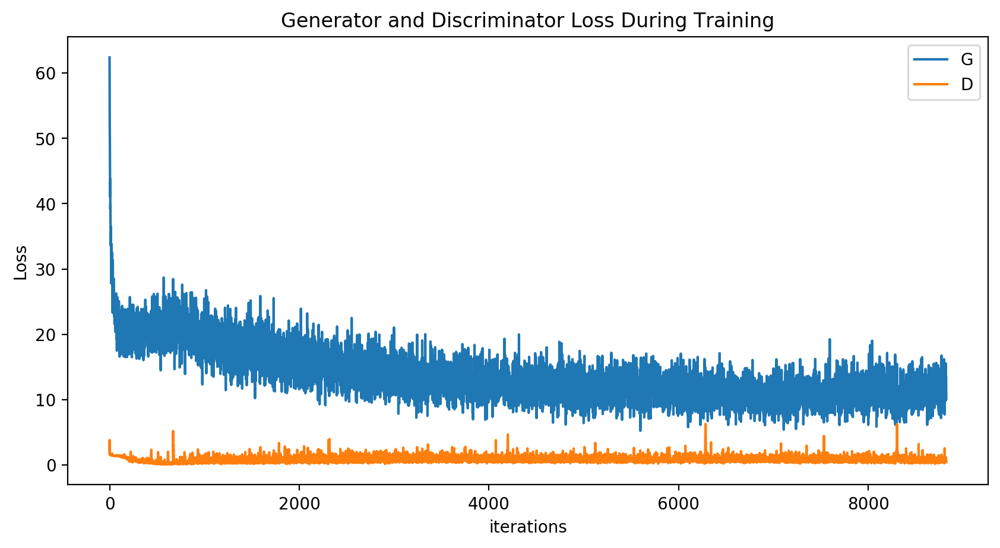

In [21]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(losses_g,label="G")
plt.plot(losses_d,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

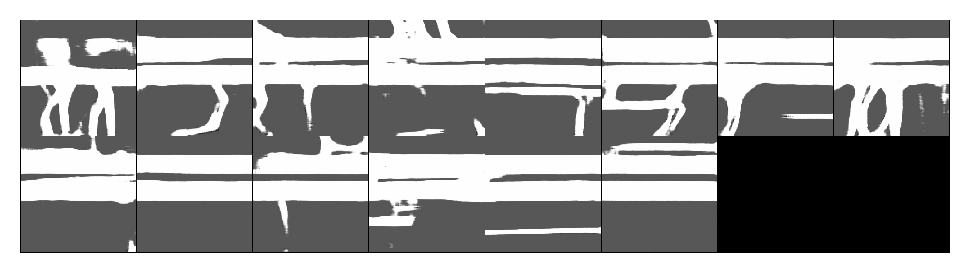

In [22]:
#%%capture
fig = plt.figure(figsize=(6,6))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in intermediate_images]
ani = animation.ArtistAnimation(fig, ims, interval=100, repeat_delay=2000, blit=True)

HTML(ani.to_jshtml())

### Evaluate trained generator model on test data (Qualitative)

In [23]:
labeled_testset = LabeledDataset(image_folder=data_dir,
                                  annotation_file=annotation_csv,
                                  scene_index=labeled_scene_index_test,
                                  img_transform=transforms.Compose([transforms.Resize((256,256)),
                                                                    transforms.ToTensor(),
                                                                    transforms.Normalize(mean=(0.5,), std=(0.5,))
                                                                   ]),
                                  map_transform=transforms.Compose([transforms.ToPILImage(),
                                                                    transforms.Resize(256),
                                                                    transforms.ToTensor()
                                                                   ]),
                                  extra_info=True
                                 )

testloader = torch.utils.data.DataLoader(labeled_testset,
                                          batch_size=1,
                                          shuffle=True,
                                          num_workers=2,
                                          collate_fn=collate_fn,
                                          pin_memory=True)

In [24]:
losses_g_L1_eval = []
inference_images = []

generator.eval()

Generator(
  (model): Sequential(
    (0): ReflectionPad2d((3, 3, 3, 3))
    (1): Conv2d(18, 128, kernel_size=(7, 7), stride=(1, 1))
    (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU(inplace=True)
    (4): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (8): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): ResnetBlock(
      (resnet_block): Sequential(
        (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Dropout(p=0.5, inplace=False)
        (4): Conv2d(512, 512, kernel_size=(3, 3), st

In [25]:
####################################
############ INFERENCE #############
####################################

for real_18ch, real_map in tqdm(testloader):
    real_18ch = real_18ch.to(device)
    real_map = real_map.to(device)

    """
    GENERATOR INFERENCE
    """
    gen_map = generator(real_18ch)
    loss_g_L1 = criterion_L1(gen_map, real_map)

    """
    COMPILE TRAINING STATISTICS
    """
    losses_g_L1_eval.append(loss_g_L1.item())
    inference_images.append(np.hstack((real_map.cpu().view([1,256,256]), (gen_map.detach().cpu().view([1,256,256])*0.5) + 0.5)))

100%|██████████| 378/378 [00:24<00:00, 15.15it/s]


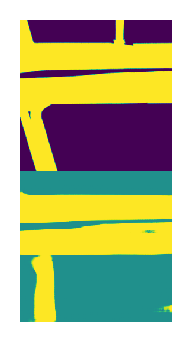

In [26]:
# %%capture
fig = plt.figure(figsize=(4,2))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)).squeeze(), animated=True)] for i in inference_images]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=2000, blit=True)

HTML(ani.to_jshtml())